In [1]:
#QN 3 function for the 3 noises

import cv2 as cv
from skimage import io
import random
import numpy as np
from matplotlib import pyplot as plt

def noisy(noise_typ,image,prob=0.05):
        
        if noise_typ == "s&p":
            output = np.zeros(image.shape,np.uint8)
            thres = 1 - 0.05 
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    rdn = random.random()
                    if rdn < prob:
                        output[i][j] = 0
                    elif rdn > thres:
                        output[i][j] = 255
                    else:
                        output[i][j] = image[i][j]
            return output
        
        elif noise_typ == "gaussian":
            row,col= image.shape
            mean = 40
            var = 25
            sigma = var**0.5
            gauss = np.random.normal(mean,sigma,(row,col))
            gauss = gauss.reshape(row,col)
            noisy = image + gauss
            noisy.astype('uint8')
            return noisy
        
        elif noise_typ =="speckle":
            row,col = image.shape
            gauss = np.random.randn(row,col)
            gauss = gauss.reshape(row,col)        
            noisy = image + image * gauss
            return noisy


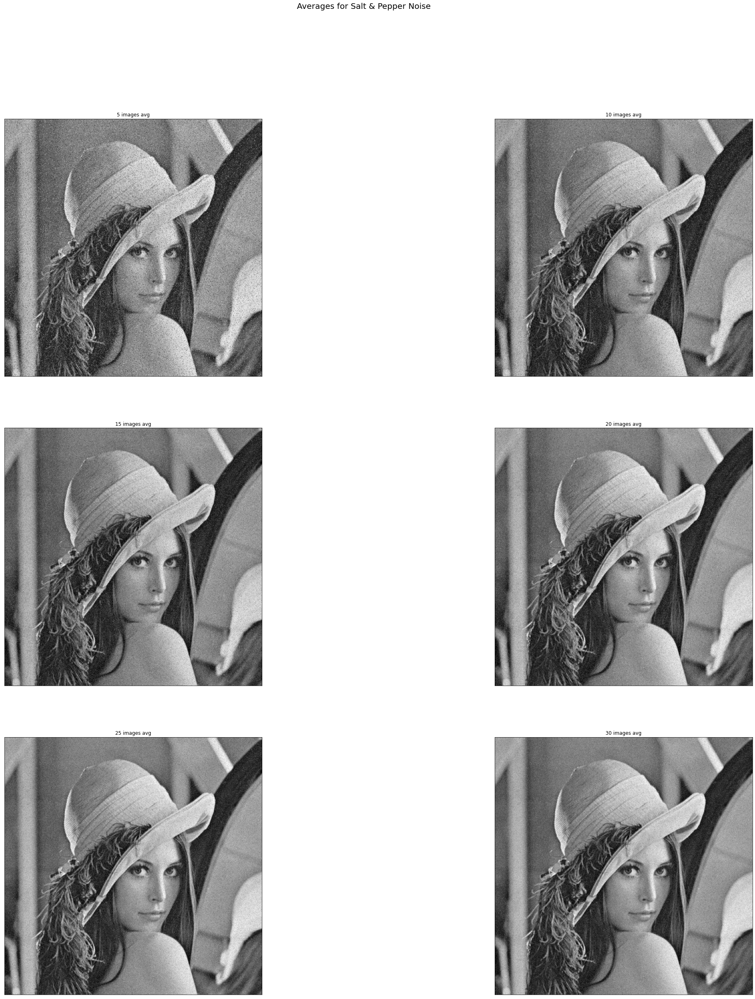

In [2]:
#Qn 3-Test with Salt & Pepper Noise
lena = cv.imread('lena512color.tiff')
lenag=cv.cvtColor(lena,cv.COLOR_BGR2GRAY)
cv.imshow("Lena(Original)",lena)
cv.imshow("Lena(Greyscale)",lenag)
cv.waitKey(0)
cv.destroyAllWindows()



outputimg=[]
for i in range(30):
    outputimg.append(noisy("s&p",lenag))
    
random5imgs=random.sample(outputimg, 5)
avg_img_5 = np.mean(random5imgs, axis=0,dtype=np.int64)
cv.imwrite("Testdamacha_qn3.png",avg_img_5)
(fig, axs) =  plt.subplots(nrows=3, ncols=2, figsize=(40, 40))
fig.suptitle("Averages for Salt & Pepper Noise",size=20)
setlen = [5,10,15,20,25,30]
c=0;
for i in range(3):
    for j in range(2):
        avg_img = np.mean(random.sample(outputimg, setlen[c]), axis=0,dtype=np.int64) 
        axs[i,j].imshow(avg_img,cmap='gray')
        axs[i,j].set_title("{} images avg".format(setlen[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()

      

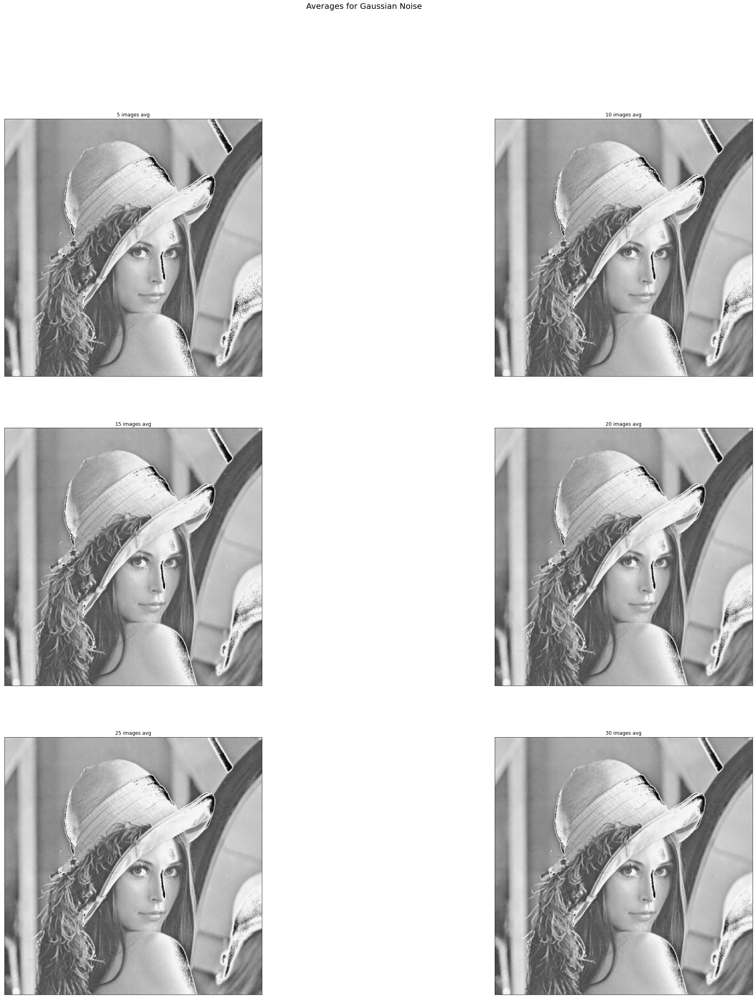

In [3]:
#Qn 3-Test with Additive Gaussian Noise
outputimg=[]
for i in range(30):
    noise_gauss = noisy("gaussian", lenag)
    noise_gauss = noise_gauss.astype('uint8')
    outputimg.append(noise_gauss)
    
#cv.imwrite("Testdamacha_qn3.png",avg_img_5)
(fig, axs) =  plt.subplots(nrows=3, ncols=2, figsize=(40, 40))
fig.suptitle("Averages for Gaussian Noise",size=20)
setlen = [5,10,15,20,25,30]
c=0;
for i in range(3):
    for j in range(2):
        avg_img = np.mean(random.sample(outputimg, setlen[c]), axis=0,dtype=np.int64) 
        axs[i,j].imshow(avg_img,cmap='gray')
        axs[i,j].set_title("{} images avg".format(setlen[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()



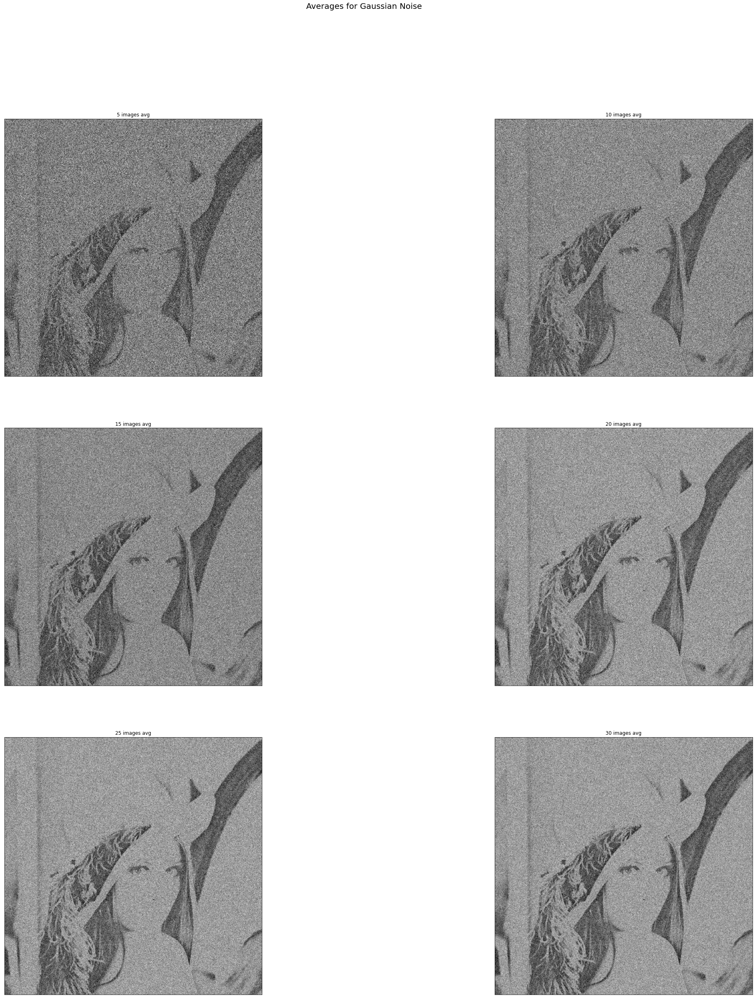

In [4]:
#Qn 3-Test with Speckle Noise
outputimg=[]
for i in range(30):
    noise_gauss = noisy("speckle", lenag)
    noise_gauss = noise_gauss.astype('uint8')
    outputimg.append(noise_gauss)
    
#cv.imwrite("Testdamacha_qn3.png",avg_img_5)
(fig, axs) =  plt.subplots(nrows=3, ncols=2, figsize=(40, 40))
fig.suptitle("Averages for Gaussian Noise",size=20)
setlen = [5,10,15,20,25,30]
c=0;
for i in range(3):
    for j in range(2):
        avg_img = np.mean(random.sample(outputimg, setlen[c]), axis=0,dtype=np.int64) 
        axs[i,j].imshow(avg_img,cmap='gray')
        axs[i,j].set_title("{} images avg".format(setlen[c]))  
        axs[i,j].axes.xaxis.set_visible(False)
        axs[i,j].axes.yaxis.set_visible(False)

        c=c+1;

plt.show()



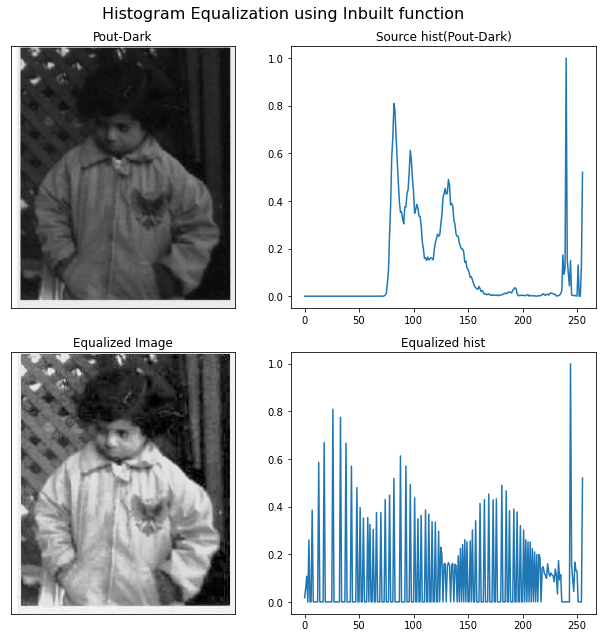

In [5]:
#Qn 6 (USING INBUILT FUNCTION)
from matplotlib import pyplot as plt
import cv2 as cv
from skimage import exposure

src = cv.imread('pout-dark.jpg',0)
if src is None:
    print('Could not open or find the image:','pout-dark.jpg')
    exit(0)
dst = cv.equalizeHist(src) 

# (fig1, axs1) =  plt.subplots(nrows=1, ncols=2, figsize=(10, 10))

# axs1[0].imshow(src,cmap='gray')
# axs1[1].imshow(dst,cmap='gray')

# for i in range(2) :
#     axs1[i].axes.xaxis.set_visible(False)
#     axs1[i].axes.yaxis.set_visible(False)
# plt.show()
# axs[0].set_title("Pout-Dark")
# axs[1].set_title("Equalized Image")


(fig, axs) =  plt.subplots(nrows=2, ncols=2, figsize=(9, 9))
for (i, image) in enumerate((src, dst)):
        (hist, bins) = exposure.histogram(image,source_range="dtype")
        axs[i,1].plot(bins, hist / hist.max())

axs[0,1].set_title("Source hist(Pout-Dark)");
axs[1,1].set_title("Equalized hist");
fig.suptitle('Histogram Equalization using Inbuilt function',size=16)

axs[0,0].imshow(src,cmap='gray')
axs[1,0].imshow(dst,cmap='gray')

for i in range(2) :
    axs[i,0].axes.xaxis.set_visible(False)
    axs[i,0].axes.yaxis.set_visible(False)

fig.tight_layout()

#plt.show()
axs[0,0].set_title("Pout-Dark");
axs[1,0].set_title("Equalized Image");


# cv.imshow('Source image', src)
# cv.imshow('Equalized Image', dst)
# cv.waitKey(0)
# cv.destroyAllWindows()

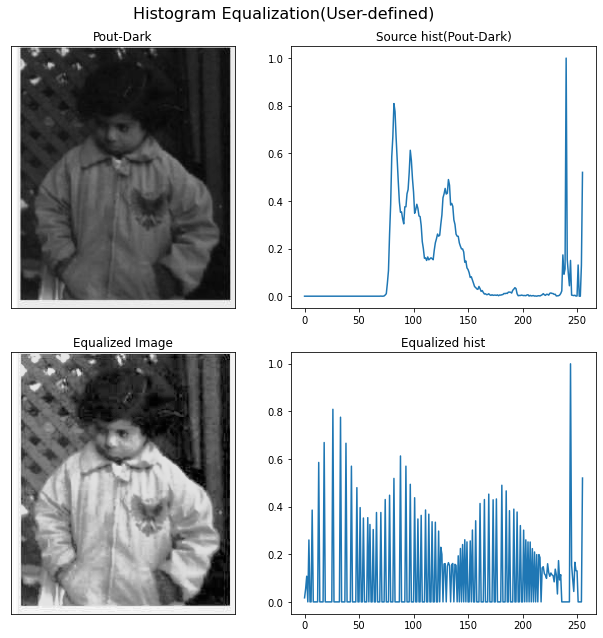

In [6]:
#Qn 6 using USER-DEFINED function
import numpy as np
from skimage import exposure
import cv2 as cv
from matplotlib import pyplot as plt
def histequalizer_userdefined (src) :     
        img = np.copy(src);
        a = np.zeros((256,),dtype=np.float16)
        
        height,width=img.shape

        #finding histogram
        for i in range(width):
            for j in range(height):
                g = img[j,i]
                a[g] = a[g]+1
            
        #print(a)
        
        #performing histogram equalization
        tmp = 1.0/(height*width)
        b = np.zeros((256,),dtype=np.float16)

        for i in range(256):
            for j in range(i+1):
                b[i] += a[j] * tmp;
            b[i] = round(b[i] * 255);

        # b now contains the equalized histogram
        b=b.astype(np.uint8)

        #print(b)

        #Re-map values from equalized histogram into the image
        for i in range(width):
            for j in range(height):
                g = img[j,i]
                img[j,i]= b[g]
                
#         cv.imshow('Source image', src)
#         cv.imshow('Equalized image',img)
#         cv.waitKey(0)
#         cv.destroyAllWindows()
        
#         (fig, axs) =  plt.subplots(nrows=1, ncols=2, figsize=(18, 5))
#         for (i, img) in enumerate((src, img)):
#                 (hist, bins) = exposure.histogram(img,source_range="dtype")
#                 axs[i].plot(bins, hist / hist.max())

#         axs[0].set_title("Source hist(Pout-Dark)")
#         axs[1].set_title("Equalized hist")
#         fig.suptitle('Histogram Equalization using USER-DEFINED function',size=16)
        (fig, axs) =  plt.subplots(nrows=2, ncols=2, figsize=(9, 9))
        for (i, image) in enumerate((src, dst)):
                (hist, bins) = exposure.histogram(image,source_range="dtype")
                axs[i,1].plot(bins, hist / hist.max())

        axs[0,1].set_title("Source hist(Pout-Dark)");
        axs[1,1].set_title("Equalized hist");
        fig.suptitle('Histogram Equalization(User-defined)',size=16)

        axs[0,0].imshow(src,cmap='gray')
        axs[1,0].imshow(dst,cmap='gray')

        for i in range(2) :
            axs[i,0].axes.xaxis.set_visible(False)
            axs[i,0].axes.yaxis.set_visible(False)

        fig.tight_layout()

        #plt.show()
        axs[0,0].set_title("Pout-Dark");
        axs[1,0].set_title("Equalized Image");  

        
##Feed the image array into the user defined function
src = cv.imread('pout-dark.jpg',0)
if src is None:
    print('Could not open or find the image:','pout-dark.jpg')
    exit(0)

histequalizer_userdefined(src)
#test=np.array([[0, 1, 1, 2, 1] ,[0 ,2 ,1 ,0 ,2]])
#histequalizer_userdefined(test)

[INFO] performing histogram matching...


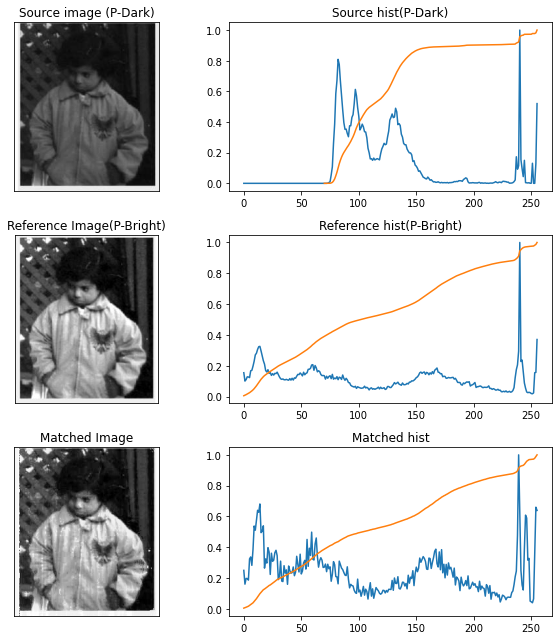

In [7]:
from skimage import exposure
import cv2 as cv


ref = cv.imread('pout-bright.jpg',0)
print("[INFO] performing histogram matching...")
multi = True if src.shape[-1] > 1 else False
matched = exposure.match_histograms(src, ref, multichannel=multi)
# show the output images
cv.imshow("Source", src)
cv.imshow("Reference", ref)
cv.imshow("Matched", matched)
cv.waitKey(0)
cv.destroyAllWindows()

(fig, axs) =  plt.subplots(nrows=3, ncols=2, figsize=(9, 9))
# loop over our source image, reference image, and output matched
# image
for (i, image) in enumerate((src, ref, matched)):
     # convert the image from BGR to RGB channel ordering
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # loop over the names of the channels in RGB order
        # compute a histogram for the current channel and plot it
        (hist, bins) = exposure.histogram(image,source_range="dtype")
        axs[i,1].plot(bins, hist / hist.max())
        # compute the cumulative distribution function for the
        # current channel and plot it
        (cdf, bins) = exposure.cumulative_distribution(image)
        axs[i,1].plot(bins, cdf)
        # set the y-axis label of the current plot to be the name
        # of the current color channel
        #axs[j, 0].set_ylabel(color)

axs[0,1].set_title("Source hist(P-Dark)")
axs[1,1].set_title("Reference hist(P-Bright)")
axs[2,1].set_title("Matched hist");



axs[0,0].imshow(src,cmap='gray')
axs[1,0].imshow(ref,cmap='gray')
axs[2,0].imshow(matched,cmap='gray')

for i in range(3) :
    axs[i,0].axes.xaxis.set_visible(False)
    axs[i,0].axes.yaxis.set_visible(False)

fig.tight_layout()

#plt.show()
axs[0,0].set_title("Source image (P-Dark)");
axs[1,0].set_title("Reference Image(P-Bright)");
axs[2,0].set_title("Matched Image");


In [8]:
#Qn 7 matched histogram user defined

def find_value_target(val, target_arr):
    key = np.where(target_arr == val)[0]

    if len(key) == 0:
        key = find_value_target(val+1, target_arr)
        if len(key) == 0:
            key = find_value_target(val-1, target_arr)
    vvv = key[0]
    return vvv


def match_histogram(inp_img, hist_input, e_hist_input, e_hist_target, _print=True):
    '''map from e_inp_hist to 'target_hist '''
    en_img = np.zeros_like(inp_img)
    tran_hist = np.zeros_like(e_hist_input)
    for i in range(len(e_hist_input)):
        tran_hist[i] = find_value_target(val=e_hist_input[i], target_arr=e_hist_target)
    print_histogram(tran_hist, name="trans_hist_", title="Transferred Histogram")
    '''enhance image as well:'''
    for x_pixel in range(inp_img.shape[0]):
        for y_pixel in range(inp_img.shape[1]):
            pixel_val = int(inp_img[x_pixel, y_pixel])
            en_img[x_pixel, y_pixel] = tran_hist[pixel_val]
    '''creating new histogram'''
    hist_img, _ = generate_histogram(en_img, print=False, index=3)
    print_img(img=en_img, histo_new=hist_img, histo_old=hist_input, index=str(3), L=L)